In [16]:
import os
import sys
import numpy as np

import matplotlib.pyplot as plt
import pandas as pd
import matplotlib as mpl
import matplotlib.ticker as ticker

import time
import matplotlib.dates as md
import dateutil
from tqdm import tqdm

from pandas import DataFrame
import random

%matplotlib inline

In [17]:
def draw_job_distribution(data,start_job_id,end_job_id, max_end_time, Sorted_start_time_list, num_gourp):
    total_color = int(3)
    cmap = mpl.cm.get_cmap("rainbow", total_color )
    colors = cmap(np.linspace(0, 1, total_color ))
    time_slot = md.date2num(dateutil.parser.parse("2016-01-01 01:00:00")) - md.date2num(dateutil.parser.parse("2016-01-01 00:00:00"))
    
    start_time_slots, start_num_parallel_jobs_per_slot, start_num_jobs_per_slot, start_num_ratio_per_slot, min_time, max_time = Num_of_Jobs_per_time_slot(data, time_slot, 'START_TIMESTAMP', Sorted_start_time_list, max_end_time, start_job_id, end_job_id)
    num_figs = 1
    y_max = max_time/num_figs
    y_min = min_time
    total_length = float(y_max - y_min)
    total_y_ticks = 20
    y_tick_list = [y_min+total_length/total_y_ticks*i for i in range(0,total_y_ticks+1)]

    f, (ax) = plt.subplots(figsize=(30, 8))
    ax1 = ax.bar(start_time_slots, start_num_jobs_per_slot, color = colors[0], label = "total")
    ax2 = ax.bar(start_time_slots, start_num_parallel_jobs_per_slot, color = colors[1], label = "parallel")

    plt.xticks(y_tick_list,md.num2date(y_tick_list),rotation=90)
    yfmt = md.DateFormatter('%Y-%m-%d %H:%M')
    ax.xaxis.set_major_formatter(yfmt)
    plt.legend()
    plt.xlim([y_min,y_max])
    plt.ylabel("num of jobs")
    plt.xlabel("executed time")
    plt.title(f"Jobs ({start_job_id}, {end_job_id}) distribution between start time and end time\n total parallel jobs = {sum(start_num_parallel_jobs_per_slot)}, total jobs = {sum(start_num_jobs_per_slot)}")                                                                                                          
    plt.savefig(f"fig/start_time_{start_job_id}_{end_job_id}.png",bbox_inches = 'tight')
#     plt.show()

    f, (ax) = plt.subplots(figsize=(30, 8))
    ax.bar(start_time_slots, start_num_ratio_per_slot, color = colors[2], label = "ratio")

    plt.xticks(y_tick_list,md.num2date(y_tick_list),rotation=90)
    yfmt = md.DateFormatter('%Y-%m-%d %H:%M')
    ax.xaxis.set_major_formatter(yfmt)
    plt.xlim([y_min,y_max])
    plt.ylabel("parallel jobs ratio")
    plt.xlabel("executed time")
    plt.title(f"Parallel job ratio ({start_job_id}, {end_job_id}) distribution between start time and end time\n averge parallel job ratio = {np.float64(sum(start_num_parallel_jobs_per_slot))/sum(start_num_jobs_per_slot)}")                                                                                                       
    plt.savefig(f"fig/start_time_ratio_{start_job_id}_{end_job_id}.png",bbox_inches = 'tight')
#     plt.show()
    
    f, (ax) = plt.subplots(figsize=(20, 8))

    total_midplanes = 96

    total_midplane_list = range(0,total_midplanes)

    total_color = int(30) + int(num_gourp)
    cmap = mpl.cm.get_cmap("rainbow", total_color )
    colors = cmap(np.linspace(0, 1, total_color ))
    total_color = int(30)
    # print(colors)
    
#     total_color2 = int(num_gourp)
#     cmap2 = mpl.cm.get_cmap("rainbow", total_color2)
#     colors2 = cmap2(np.linspace(0, 1, total_color2))
    
    plt.ylim([0,total_midplanes])

    y_max = md.date2num(dateutil.parser.parse("2014-12-31 00:00:00"))
    y_min = md.date2num(dateutil.parser.parse("2016-01-01 00:00:00"))
    

#     for i in tqdm(range(start_job_id,end_job_id)):
    for i in range(start_job_id,end_job_id):
        job_id = Sorted_start_time_list[i]
#     print(job_id, data['JOB_NAME'][job_id])
        used_midplane_list = TransferMidPlane(data['LOCATION'][job_id],job_id)
        start_dates_in_each_midplane = []
        end_dates_in_each_midplane = []
        total_used_midplane_list = []
        start_time = md.date2num(dateutil.parser.parse(data['START_TIMESTAMP'][job_id]))
        end_time = md.date2num(dateutil.parser.parse(data['END_TIMESTAMP'][job_id]))
        if(y_min > start_time):
            y_min = start_time
        if y_max < end_time:
            y_max = end_time
#     print(start_time,end_time)
        for midplane_id in total_midplane_list:
            if midplane_id in used_midplane_list:
                total_used_midplane_list.append(midplane_id)
                start_dates_in_each_midplane.append(start_time)
                end_dates_in_each_midplane.append(end_time - start_time)
#     print(job_id, total_color , job_id % total_color )
#         if(int(data['NUM_TASKS_MULTILOCATION'][job_id]) == 0):
#             ax.barh(y=total_used_midplane_list, left=start_dates_in_each_midplane, width=end_dates_in_each_midplane, color = colors[int(job_id%total_color)])
#         else:
        ax.barh(y=total_used_midplane_list, left=start_dates_in_each_midplane, width=end_dates_in_each_midplane, color = colors[int(job_id%total_color)], ec=colors[30+int(data['IS_OVERBURN'][job_id])], ls='-')

    total_length = float(y_max - y_min)
    total_y_ticks = 30
    y_tick_list = [y_min+total_length/total_y_ticks*i for i in range(0,total_y_ticks+1)]
    # print(y_tick_list)
    # print(md.num2date(y_tick_list))

    plt.yticks(range(0,96,5))
    plt.xticks(y_tick_list,md.num2date(y_tick_list),rotation=90)
    yfmt = md.DateFormatter('%Y-%m-%d %H:%M')
    ax.xaxis.set_major_formatter(yfmt)
    plt.xlim([y_min,y_max])
    plt.ylabel("midplanes")
    plt.xlabel("executed time")
    plt.title("Job Distribution")
    plt.savefig(f"fig/Job_distribution_{start_job_id}_{end_job_id}.png",bbox_inches = 'tight')
#     plt.show()

In [18]:
def sort_job_id(data, sort_time):
    job_tuples = []
    length = len(data[sort_time])
#     length = 5
    for i in tqdm(range(0,length)):
        job_tuples.append((i,md.date2num(dateutil.parser.parse(data[sort_time][i]))))
#     print(job_tuples)
    new_job_tuples = sorted(job_tuples, key=lambda time: time[1])
#     print(new_job_tuples)
    job_sorted_list = np.zeros([length], np.int)
    for i in tqdm(range(0,length)):
        job_sorted_list[i] = new_job_tuples[i][0]
    return job_sorted_list

def Max_end_time(data):
    max_end_time = 0
    length = len(data['END_TIMESTAMP'])
    for i in tqdm(range(0,length)):
        end_time = md.date2num(dateutil.parser.parse(data['END_TIMESTAMP'][i]))
        if max_end_time < end_time:
            max_end_time = end_time
    return max_end_time


In [19]:
def add_group_id(data,num_group):
    for i in range(0,len(data['IS_OVERBURN'])):
        group_id = random.randint(0, num_group-1)
        data['IS_OVERBURN'][i] = group_id
    return data

In [20]:
def TransferMidPlane(location, job_id):
    location_list = location.split("-")
    if(location_list[-1] == 'UNKNOWN'):
        return []
    num_nodes = int(location_list[-1])
    num_midplanes = num_nodes / 512
    midplane_list = []
    midplane_id = [0, 0, 0, 0, 0]
    start_node_ids = [0, 0, 0, 0, 0]
    end_node_ids = [0, 0, 0, 0, 0]
    k = 0
    start_node_ids[k] = int(location_list[1][k],16)
    end_node_ids[k] = int(location_list[2][k],16) + 1
    if (end_node_ids[k] - start_node_ids[k]) % 4 != 0:
        print("Error!! There is a job not use the whole midplane")
    for midplane_id[k] in range(start_node_ids[k], end_node_ids[k], 4):
        k = 1
        start_node_ids[k] = int(location_list[1][k],16)
        end_node_ids[k] = int(location_list[2][k],16) + 1
        if (end_node_ids[k] - start_node_ids[k]) % 4 != 0:
            print("Error!! There is a job not use the whole midplane")
        for midplane_id[k] in range(start_node_ids[k], end_node_ids[k], 4):
            k = 2
            start_node_ids[k] = int(location_list[1][k],16)
            end_node_ids[k] = int(location_list[2][k],16) + 1
            if (end_node_ids[k] - start_node_ids[k]) % 4 != 0:
                print("Error!! There is a job not use the whole midplane")
            for midplane_id[k] in range(start_node_ids[k], end_node_ids[k], 4):
                k = 3
                start_node_ids[k] = int(location_list[1][k],16)
                end_node_ids[k] = int(location_list[2][k],16) + 1
                if (end_node_ids[k] - start_node_ids[k]) % 4 != 0:
                    print("Error!! There is a job not use the whole midplane")
                for midplane_id[k] in range(start_node_ids[k], end_node_ids[k], 4):
#                     print(midplane_id[k], start_node_ids[k], end_node_ids[k])
                    k = 4
                    start_node_ids[k] = int(location_list[1][k],16)
                    end_node_ids[k] = int(location_list[2][k],16) + 1
                    if (end_node_ids[k] - start_node_ids[k]) % 2 != 0:
                        print("Error!! There is a job not use the whole midplane")
                    for midplane_id[k] in range(start_node_ids[k], end_node_ids[k], 2):
                        new_midplane_id = midplane_id[3]/4 + midplane_id[2]/4 * 4 + midplane_id[1]/4 * 4 * 4 + midplane_id[0]/4 * 4 * 4 * 3
                        midplane_list.append(int(new_midplane_id))
#                         print(new_midplane_id,midplane_id)
                    k = 3
                k = 2
            k = 1
        k = 0
    if len(midplane_list)*512 != num_nodes:
        print("[job id = %d]Error !! start_node_id = %s, end_node_id = %s, total = %d not equal to %s" %(job_id, location_list[1], location_list[2], len(midplane_list)*512, num_nodes))
        print(location)
    return midplane_list

In [21]:
def Num_of_Jobs_per_time_slot(data, time_slot, time, sorted_map, end_time, start_job_idx, end_job_idx):
    print(dateutil.parser.parse(data[time][sorted_map[start_job_idx]]))
    start_time = md.date2num(dateutil.parser.parse(data[time][sorted_map[start_job_idx]])) 
    total_time = end_time - start_time
    num_slots = int(total_time / time_slot) + 1
    max_end_time = start_time
    
    num_jobs_per_slot = np.zeros([num_slots],np.int64)
    num_parallel_jobs_per_slot = np.zeros([num_slots],np.int64)
    num_ratio_per_slot = np.zeros([num_slots],np.float64)
    time_slots = np.zeros([num_slots],np.float64)
    
    num_jobs = end_job_idx - start_job_idx
#     num_jobs = 10
#     for i in tqdm(range(start_job_idx, end_job_idx)):
    for i in range(start_job_idx, end_job_idx):
        start = md.date2num(dateutil.parser.parse(data[time][sorted_map[i]])) 
        end = md.date2num(dateutil.parser.parse(data['END_TIMESTAMP'][sorted_map[i]])) 
        if (max_end_time < end):
            max_end_time = end
        parallel_jobs = int(data['NUM_TASKS_MULTILOCATION'][sorted_map[i]])
        start_index = int((start-start_time)/time_slot)
        end_index = int((end - start_time )/time_slot) + 1
#         print(start,end,start_index,end_index,end,start_time ,time_slot)
        for j in range(start_index, end_index):
            num_jobs_per_slot[j] += 1
            if parallel_jobs > 0:
                num_parallel_jobs_per_slot[j] +=1
    
    new_num_slots = int((max_end_time - start_time)/ time_slot) + 1
    for i in range(0, num_slots):
        time_slots[i] = start_time + i * time_slot + 0.5 * time_slot
        if(np.float64(num_jobs_per_slot[i]) > 0):
            num_ratio_per_slot[i] = np.float64(num_parallel_jobs_per_slot[i]) / np.float64(num_jobs_per_slot[i])
        else:
            num_ratio_per_slot[i] = 0
    
    return time_slots[:new_num_slots], num_parallel_jobs_per_slot[:new_num_slots], num_jobs_per_slot[:new_num_slots], num_ratio_per_slot[:new_num_slots], start_time, max_end_time
        
        

100%|████████████████████████████████████████████████████████████████████████████████████████████████| 82858/82858 [00:09<00:00, 8355.66it/s]
/var/folders/ch/qkmvbw8d40d5864w96srwgpr0000gn/T/ipykernel_57634/770822527.py:10: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  job_sorted_list = np.zeros([length], np.int)
100%|█████████████████████████████████████████████████████████████████████████████████████████████| 82858/82858 [00:00<00:00, 2646871.96it/s]
/var/folders/ch/qkmvbw8d40d5864w96srwgpr0000gn/T/ipykernel_57634/1988466917.py:4: SettingWithCo

2014-12-31 13:56:07
[job id = 423]Error !! start_node_id = 08000, end_node_id = 7BFF1, total = 16384 not equal to 12288
MIR-08000-7BFF1-0020-12288
[job id = 425]Error !! start_node_id = 08000, end_node_id = 7BFF1, total = 16384 not equal to 12288
MIR-08000-7BFF1-0020-12288
[job id = 830]Error !! start_node_id = 00000, end_node_id = 3BFF1, total = 24576 not equal to 16384
MIR-00000-3BFF1-0100-16384
[job id = 864]Error !! start_node_id = 08000, end_node_id = 7BFF1, total = 16384 not equal to 12288
MIR-08000-7BFF1-0020-12288
[job id = 1506]Error !! start_node_id = 00000, end_node_id = 3BFF1, total = 24576 not equal to 16384
MIR-00000-3BFF1-0100-16384
[job id = 1508]Error !! start_node_id = 00000, end_node_id = 3BFF1, total = 24576 not equal to 16384
MIR-00000-3BFF1-0100-16384
[job id = 1513]Error !! start_node_id = 00000, end_node_id = 3BFF1, total = 24576 not equal to 16384
MIR-00000-3BFF1-0100-16384
[job id = 1541]Error !! start_node_id = 08000, end_node_id = 7BFF1, total = 16384 not eq

  2%|██▌                                                                                                      | 1/42 [00:16<11:19, 16.57s/it]

2015-01-16 14:10:47
[job id = 2308]Error !! start_node_id = 00000, end_node_id = 3BFF1, total = 24576 not equal to 16384
MIR-00000-3BFF1-0100-16384
[job id = 2319]Error !! start_node_id = 00000, end_node_id = 3BFF1, total = 24576 not equal to 16384
MIR-00000-3BFF1-0100-16384
[job id = 2349]Error !! start_node_id = 00000, end_node_id = 3BFF1, total = 24576 not equal to 16384
MIR-00000-3BFF1-0100-16384
[job id = 2383]Error !! start_node_id = 00000, end_node_id = 3BFF1, total = 24576 not equal to 16384
MIR-00000-3BFF1-0100-16384


  5%|█████                                                                                                    | 2/42 [00:32<10:40, 16.01s/it]

2015-01-29 16:32:18
[job id = 4610]Error !! start_node_id = 08000, end_node_id = 7BFF1, total = 16384 not equal to 12288
MIR-08000-7BFF1-0020-12288


  7%|███████▌                                                                                                 | 3/42 [00:45<09:30, 14.62s/it]

2015-02-11 11:47:35
[job id = 6063]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 6397]Error !! start_node_id = 00000, end_node_id = 3BFF1, total = 24576 not equal to 16384
MIR-00000-3BFF1-0100-16384
[job id = 7362]Error !! start_node_id = 40000, end_node_id = 7BFF1, total = 24576 not equal to 16384
MIR-40000-7BFF1-0100-16384
[job id = 7383]Error !! start_node_id = 40000, end_node_id = 7BFF1, total = 24576 not equal to 16384
MIR-40000-7BFF1-0100-16384
[job id = 7734]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288


 10%|██████████                                                                                               | 4/42 [00:59<09:13, 14.56s/it]

2015-02-25 12:47:59
[job id = 8026]Error !! start_node_id = 00000, end_node_id = 3BFF1, total = 24576 not equal to 16384
MIR-00000-3BFF1-0100-16384
[job id = 8027]Error !! start_node_id = 00000, end_node_id = 3BFF1, total = 24576 not equal to 16384
MIR-00000-3BFF1-0100-16384
[job id = 8031]Error !! start_node_id = 00000, end_node_id = 3BFF1, total = 24576 not equal to 16384
MIR-00000-3BFF1-0100-16384
[job id = 8032]Error !! start_node_id = 00000, end_node_id = 3BFF1, total = 24576 not equal to 16384
MIR-00000-3BFF1-0100-16384
[job id = 8593]Error !! start_node_id = 40000, end_node_id = 7BFF1, total = 24576 not equal to 16384
MIR-40000-7BFF1-0100-16384
[job id = 8595]Error !! start_node_id = 40000, end_node_id = 7BFF1, total = 24576 not equal to 16384
MIR-40000-7BFF1-0100-16384
[job id = 8800]Error !! start_node_id = 00000, end_node_id = 3BFF1, total = 24576 not equal to 16384
MIR-00000-3BFF1-0100-16384
[job id = 9174]Error !! start_node_id = 40000, end_node_id = 7BFF1, total = 24576 no

 12%|████████████▌                                                                                            | 5/42 [01:16<09:31, 15.45s/it]

2015-03-08 17:15:19
[job id = 10017]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0010-12288
[job id = 10105]Error !! start_node_id = 00000, end_node_id = 73FF1, total = 16384 not equal to 12288
MIR-00000-73FF1-0020-12288
[job id = 10143]Error !! start_node_id = 00000, end_node_id = 73FF1, total = 16384 not equal to 12288
MIR-00000-73FF1-0020-12288
[job id = 10192]Error !! start_node_id = 00000, end_node_id = 73FF1, total = 16384 not equal to 12288
MIR-00000-73FF1-0020-12288
[job id = 10206]Error !! start_node_id = 00000, end_node_id = 73FF1, total = 16384 not equal to 12288
MIR-00000-73FF1-0020-12288
[job id = 10342]Error !! start_node_id = 08000, end_node_id = 7BFF1, total = 16384 not equal to 12288
MIR-08000-7BFF1-0020-12288
[job id = 10354]Error !! start_node_id = 08000, end_node_id = 7BFF1, total = 16384 not equal to 12288
MIR-08000-7BFF1-0020-12288
[job id = 10362]Error !! start_node_id = 08000, end_node_id = 7BFF1, total = 

 14%|███████████████                                                                                          | 6/42 [01:34<09:39, 16.11s/it]

2015-03-20 23:33:48


/var/folders/ch/qkmvbw8d40d5864w96srwgpr0000gn/T/ipykernel_57634/1870306264.py:43: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f, (ax) = plt.subplots(figsize=(20, 8))


[job id = 12270]Error !! start_node_id = 08000, end_node_id = 7BFF1, total = 16384 not equal to 12288
MIR-08000-7BFF1-0010-12288
[job id = 12844]Error !! start_node_id = 08000, end_node_id = 7BFF1, total = 16384 not equal to 12288
MIR-08000-7BFF1-0020-12288
[job id = 13545]Error !! start_node_id = 08000, end_node_id = 7BFF1, total = 16384 not equal to 12288
MIR-08000-7BFF1-0020-12288


 17%|█████████████████▌                                                                                       | 7/42 [01:46<08:37, 14.79s/it]

2015-03-28 13:32:48
[job id = 14950]Error !! start_node_id = 00000, end_node_id = 73FF1, total = 16384 not equal to 12288
MIR-00000-73FF1-0020-12288
[job id = 15059]Error !! start_node_id = 00000, end_node_id = 3BFF1, total = 24576 not equal to 16384
MIR-00000-3BFF1-0100-16384
[job id = 15293]Error !! start_node_id = 08000, end_node_id = 7BFF1, total = 16384 not equal to 12288
MIR-08000-7BFF1-0020-12288
[job id = 15453]Error !! start_node_id = 08000, end_node_id = 7BFF1, total = 16384 not equal to 12288
MIR-08000-7BFF1-0020-12288
[job id = 15430]Error !! start_node_id = 00000, end_node_id = 73FF1, total = 16384 not equal to 12288
MIR-00000-73FF1-0010-12288
[job id = 15634]Error !! start_node_id = 40000, end_node_id = 7BFF1, total = 24576 not equal to 16384
MIR-40000-7BFF1-0100-16384
[job id = 15704]Error !! start_node_id = 40000, end_node_id = 7BFF1, total = 24576 not equal to 16384
MIR-40000-7BFF1-0100-16384
[job id = 15643]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 

 19%|████████████████████                                                                                     | 8/42 [02:01<08:30, 15.01s/it]

2015-04-04 13:14:12
[job id = 16044]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 16128]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 16297]Error !! start_node_id = 08000, end_node_id = 7BFF1, total = 16384 not equal to 12288
MIR-08000-7BFF1-0020-12288
[job id = 16307]Error !! start_node_id = 08000, end_node_id = 7BFF1, total = 16384 not equal to 12288
MIR-08000-7BFF1-0020-12288
[job id = 16330]Error !! start_node_id = 08000, end_node_id = 7BFF1, total = 16384 not equal to 12288
MIR-08000-7BFF1-0020-12288
[job id = 16343]Error !! start_node_id = 08000, end_node_id = 7BFF1, total = 16384 not equal to 12288
MIR-08000-7BFF1-0020-12288
[job id = 17056]Error !! start_node_id = 08000, end_node_id = 7BFF1, total = 16384 not equal to 12288
MIR-08000-7BFF1-0020-12288
[job id = 17061]Error !! start_node_id = 08000, end_node_id = 7BFF1, total = 

 21%|██████████████████████▌                                                                                  | 9/42 [02:16<08:16, 15.04s/it]

2015-04-13 08:11:18
[job id = 18156]Error !! start_node_id = 40000, end_node_id = 7BFF1, total = 24576 not equal to 16384
MIR-40000-7BFF1-0100-16384
[job id = 18158]Error !! start_node_id = 40000, end_node_id = 7BFF1, total = 24576 not equal to 16384
MIR-40000-7BFF1-0100-16384
[job id = 18159]Error !! start_node_id = 40000, end_node_id = 7BFF1, total = 24576 not equal to 16384
MIR-40000-7BFF1-0100-16384
[job id = 18162]Error !! start_node_id = 40000, end_node_id = 7BFF1, total = 24576 not equal to 16384
MIR-40000-7BFF1-0100-16384
[job id = 18163]Error !! start_node_id = 40000, end_node_id = 7BFF1, total = 24576 not equal to 16384
MIR-40000-7BFF1-0100-16384
[job id = 18164]Error !! start_node_id = 40000, end_node_id = 7BFF1, total = 24576 not equal to 16384
MIR-40000-7BFF1-0100-16384
[job id = 18167]Error !! start_node_id = 40000, end_node_id = 7BFF1, total = 24576 not equal to 16384
MIR-40000-7BFF1-0100-16384
[job id = 18170]Error !! start_node_id = 40000, end_node_id = 7BFF1, total = 

 24%|████████████████████████▊                                                                               | 10/42 [02:35<08:42, 16.34s/it]

2015-04-22 16:49:17
[job id = 21603]Error !! start_node_id = 00000, end_node_id = 3BFF1, total = 24576 not equal to 16384
MIR-00000-3BFF1-0100-16384
[job id = 21604]Error !! start_node_id = 00000, end_node_id = 3BFF1, total = 24576 not equal to 16384
MIR-00000-3BFF1-0100-16384
[job id = 21606]Error !! start_node_id = 00000, end_node_id = 3BFF1, total = 24576 not equal to 16384
MIR-00000-3BFF1-0100-16384
[job id = 21607]Error !! start_node_id = 00000, end_node_id = 3BFF1, total = 24576 not equal to 16384
MIR-00000-3BFF1-0100-16384
[job id = 21609]Error !! start_node_id = 00000, end_node_id = 3BFF1, total = 24576 not equal to 16384
MIR-00000-3BFF1-0100-16384
[job id = 21610]Error !! start_node_id = 00000, end_node_id = 3BFF1, total = 24576 not equal to 16384
MIR-00000-3BFF1-0100-16384
[job id = 21617]Error !! start_node_id = 00000, end_node_id = 3BFF1, total = 24576 not equal to 16384
MIR-00000-3BFF1-0100-16384
[job id = 21622]Error !! start_node_id = 00000, end_node_id = 3BFF1, total = 

 26%|███████████████████████████▏                                                                            | 11/42 [02:53<08:39, 16.76s/it]

2015-05-06 11:32:19
[job id = 23411]Error !! start_node_id = 00000, end_node_id = 3BFF1, total = 24576 not equal to 16384
MIR-00000-3BFF1-0100-16384
[job id = 23593]Error !! start_node_id = 00000, end_node_id = 3BFF1, total = 24576 not equal to 16384
MIR-00000-3BFF1-0100-16384
Error!! There is a job not use the whole midplane
[job id = 23781]Error !! start_node_id = 08000, end_node_id = 4BFF1, total = 16384 not equal to 8192
MIR-08000-4BFF1-3-8192
Error!! There is a job not use the whole midplane
[job id = 23785]Error !! start_node_id = 08000, end_node_id = 4BFF1, total = 16384 not equal to 8192
MIR-08000-4BFF1-3-8192
Error!! There is a job not use the whole midplane
[job id = 23786]Error !! start_node_id = 08000, end_node_id = 4BFF1, total = 16384 not equal to 8192
MIR-08000-4BFF1-3-8192
Error!! There is a job not use the whole midplane
[job id = 23793]Error !! start_node_id = 08000, end_node_id = 4BFF1, total = 16384 not equal to 8192
MIR-08000-4BFF1-3-8192
Error!! There is a job not

 29%|█████████████████████████████▋                                                                          | 12/42 [03:10<08:25, 16.85s/it]

2015-05-16 20:55:49
[job id = 24414]Error !! start_node_id = 00000, end_node_id = 73FF1, total = 16384 not equal to 12288
MIR-00000-73FF1-0020-12288


 31%|████████████████████████████████▏                                                                       | 13/42 [03:22<07:27, 15.44s/it]

2015-05-26 15:30:16
[job id = 26371]Error !! start_node_id = 08000, end_node_id = 7BFF1, total = 16384 not equal to 12288
MIR-08000-7BFF1-0020-12288
[job id = 26432]Error !! start_node_id = 08000, end_node_id = 7BFF1, total = 16384 not equal to 12288
MIR-08000-7BFF1-0010-12288
[job id = 26730]Error !! start_node_id = 00000, end_node_id = 3BFF1, total = 24576 not equal to 16384
MIR-00000-3BFF1-0100-16384
[job id = 26755]Error !! start_node_id = 00000, end_node_id = 3BFF1, total = 24576 not equal to 16384
MIR-00000-3BFF1-0100-16384


 33%|██████████████████████████████████▋                                                                     | 14/42 [03:33<06:32, 14.03s/it]

2015-06-05 02:52:07
[job id = 28122]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288


 36%|█████████████████████████████████████▏                                                                  | 15/42 [03:44<05:51, 13.00s/it]

2015-06-11 09:00:08


 38%|███████████████████████████████████████▌                                                                | 16/42 [03:59<05:57, 13.76s/it]

2015-06-21 15:12:15
[job id = 32812]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 33206]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 33212]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
Error!! There is a job not use the whole midplane
[job id = 33973]Error !! start_node_id = 08000, end_node_id = 4BFF1, total = 16384 not equal to 8192
MIR-08000-4BFF1-3-8192


 40%|██████████████████████████████████████████                                                              | 17/42 [04:12<05:38, 13.54s/it]

2015-06-30 11:13:18
[job id = 34239]Error !! start_node_id = 08000, end_node_id = 7BFF1, total = 16384 not equal to 12288
MIR-08000-7BFF1-0020-12288
[job id = 34361]Error !! start_node_id = 08000, end_node_id = 7BFF1, total = 16384 not equal to 12288
MIR-08000-7BFF1-0020-12288
[job id = 34463]Error !! start_node_id = 00000, end_node_id = 73FF1, total = 16384 not equal to 12288
MIR-00000-73FF1-0020-12288
[job id = 34633]Error !! start_node_id = 08000, end_node_id = 7BFF1, total = 16384 not equal to 12288
MIR-08000-7BFF1-0020-12288
[job id = 34660]Error !! start_node_id = 08000, end_node_id = 7BFF1, total = 16384 not equal to 12288
MIR-08000-7BFF1-0020-12288
[job id = 34701]Error !! start_node_id = 08000, end_node_id = 7BFF1, total = 16384 not equal to 12288
MIR-08000-7BFF1-0020-12288
[job id = 34939]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 35048]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 

 43%|████████████████████████████████████████████▌                                                           | 18/42 [04:28<05:40, 14.21s/it]

2015-07-16 01:19:28
[job id = 36110]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 36112]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 36125]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 36133]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 36182]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 36190]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 36201]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 36240]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 

 45%|███████████████████████████████████████████████                                                         | 19/42 [04:40<05:09, 13.47s/it]

2015-07-24 15:09:31
[job id = 38030]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 38044]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 38236]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 39372]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 39760]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 39779]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 39867]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 39888]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 

 48%|█████████████████████████████████████████████████▌                                                      | 20/42 [04:53<04:56, 13.50s/it]

2015-08-02 02:56:23
[job id = 40005]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 40038]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 40046]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 40055]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 40091]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 40148]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 40264]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 40572]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 

 50%|████████████████████████████████████████████████████                                                    | 21/42 [05:03<04:19, 12.38s/it]

2015-08-08 18:03:13
[job id = 42304]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 42429]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 42507]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 42758]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 42889]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 42951]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 43031]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 43528]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 

 52%|██████████████████████████████████████████████████████▍                                                 | 22/42 [05:10<03:33, 10.68s/it]

2015-08-11 23:31:23
[job id = 44173]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 44402]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 44553]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 44648]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 44838]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288


 55%|████████████████████████████████████████████████████████▉                                               | 23/42 [05:16<02:56,  9.27s/it]

2015-08-14 00:29:43
[job id = 46621]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 47059]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 47258]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 47355]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 47473]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 47571]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 47806]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 47890]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 

 57%|███████████████████████████████████████████████████████████▍                                            | 24/42 [05:22<02:28,  8.27s/it]

2015-08-16 01:30:35
[job id = 49770]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288


 60%|█████████████████████████████████████████████████████████████▉                                          | 25/42 [05:28<02:11,  7.74s/it]

2015-08-17 22:59:14


 62%|████████████████████████████████████████████████████████████████▍                                       | 26/42 [05:36<02:04,  7.76s/it]

2015-08-22 15:43:07


 64%|██████████████████████████████████████████████████████████████████▊                                     | 27/42 [05:46<02:04,  8.28s/it]

2015-08-27 17:00:38


 67%|█████████████████████████████████████████████████████████████████████▎                                  | 28/42 [05:52<01:46,  7.64s/it]

2015-08-30 22:13:43


 69%|███████████████████████████████████████████████████████████████████████▊                                | 29/42 [05:59<01:37,  7.54s/it]

2015-09-03 06:16:39


 71%|██████████████████████████████████████████████████████████████████████████▎                             | 30/42 [06:05<01:23,  6.99s/it]

2015-09-06 04:00:53


 74%|████████████████████████████████████████████████████████████████████████████▊                           | 31/42 [06:13<01:21,  7.42s/it]

2015-09-08 07:11:21


 76%|███████████████████████████████████████████████████████████████████████████████▏                        | 32/42 [06:20<01:12,  7.25s/it]

2015-09-11 16:24:44


 79%|█████████████████████████████████████████████████████████████████████████████████▋                      | 33/42 [06:26<01:00,  6.71s/it]

2015-09-13 14:18:31
[job id = 66240]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288


 81%|████████████████████████████████████████████████████████████████████████████████████▏                   | 34/42 [06:38<01:07,  8.48s/it]

2015-09-24 22:58:14
[job id = 69373]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 69376]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 69378]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 69380]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 69508]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288


 83%|██████████████████████████████████████████████████████████████████████████████████████▋                 | 35/42 [06:52<01:10, 10.14s/it]

2015-10-05 07:53:25
[job id = 72080]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288


 86%|█████████████████████████████████████████████████████████████████████████████████████████▏              | 36/42 [07:04<01:04, 10.70s/it]

2015-10-16 08:11:54
[job id = 73535]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288


 88%|███████████████████████████████████████████████████████████████████████████████████████████▌            | 37/42 [07:15<00:53, 10.65s/it]

2015-10-27 03:59:01


 90%|██████████████████████████████████████████████████████████████████████████████████████████████          | 38/42 [07:27<00:44, 11.13s/it]

2015-11-10 09:34:33


 93%|████████████████████████████████████████████████████████████████████████████████████████████████▌       | 39/42 [07:44<00:38, 12.88s/it]

2015-11-25 21:09:00
[job id = 78163]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 78166]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 78169]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 78172]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 78174]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 78177]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288
[job id = 79517]Error !! start_node_id = 04000, end_node_id = 77FF1, total = 16384 not equal to 12288
MIR-04000-77FF1-0020-12288


 95%|███████████████████████████████████████████████████████████████████████████████████████████████████     | 40/42 [07:56<00:25, 12.59s/it]

2015-12-09 17:36:04


 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████▌  | 41/42 [08:09<00:12, 12.69s/it]

2015-12-25 08:11:39


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████| 42/42 [08:16<00:00, 11.83s/it]


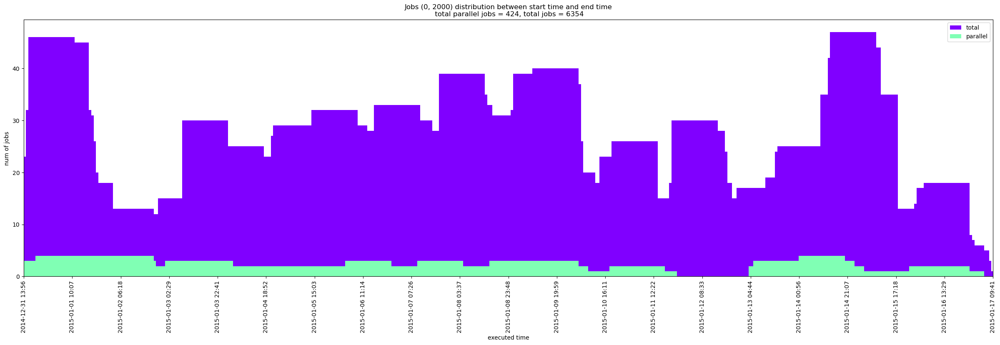

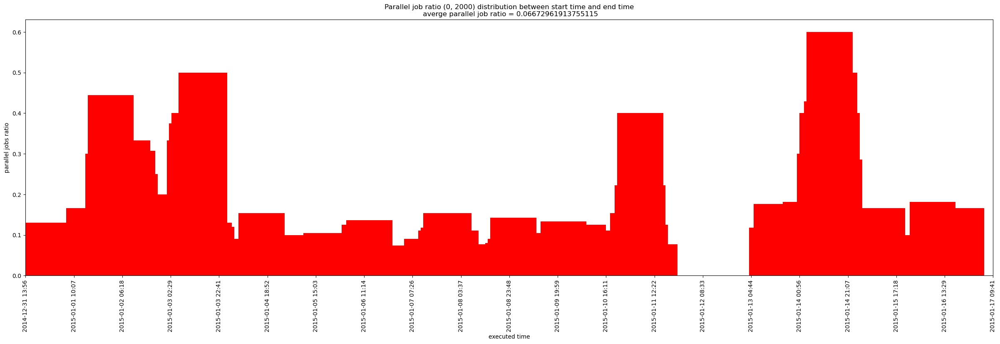

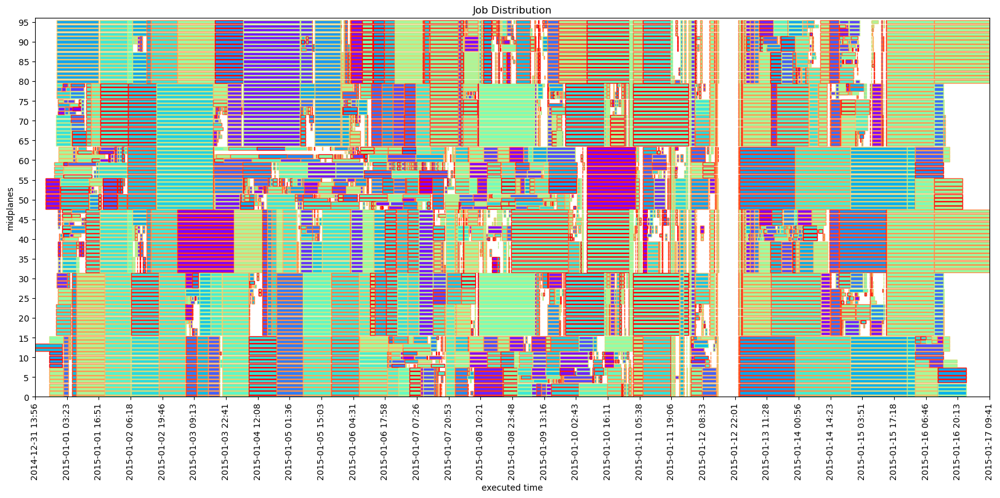

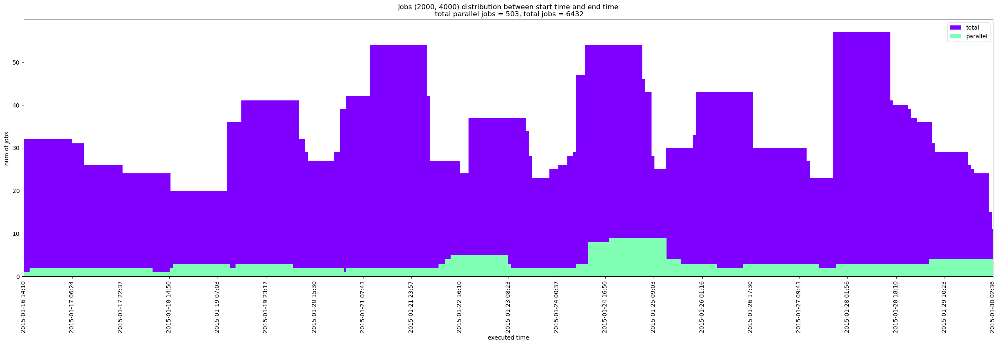

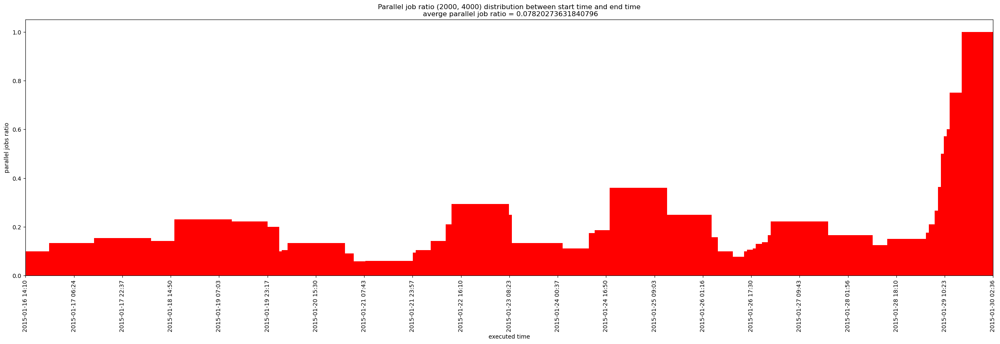

...

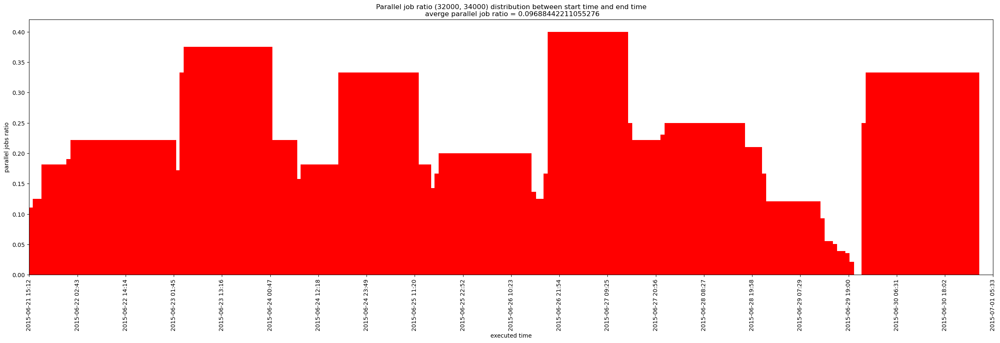

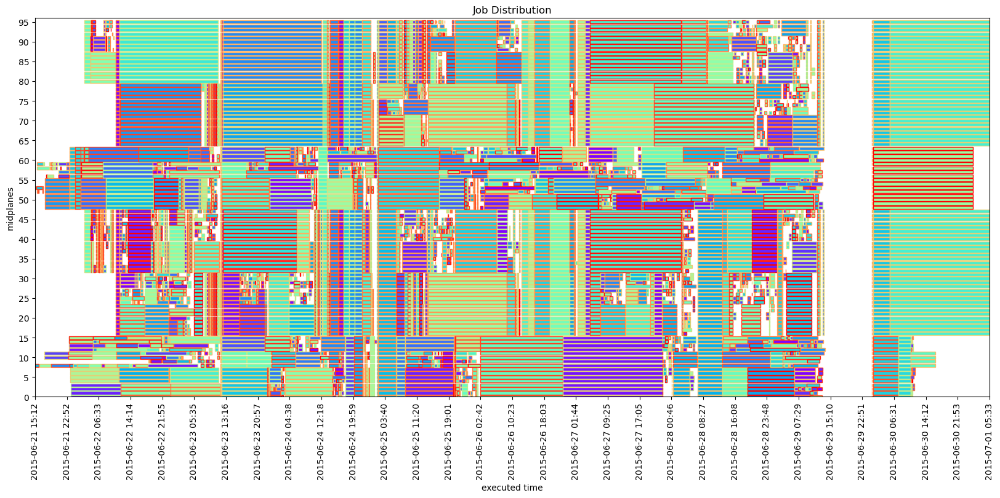

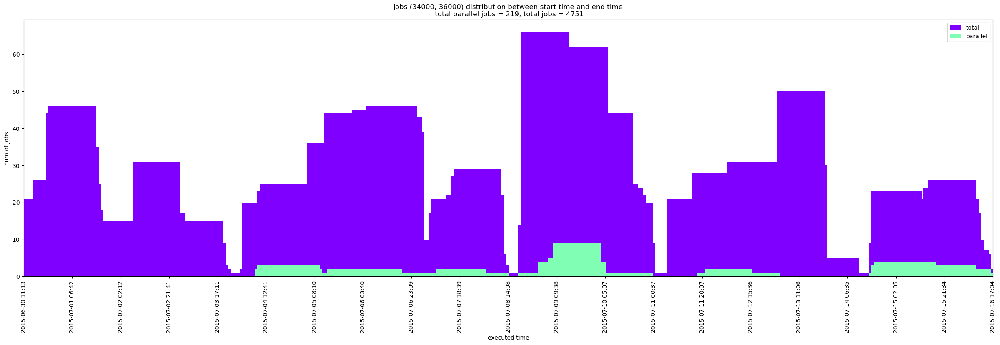

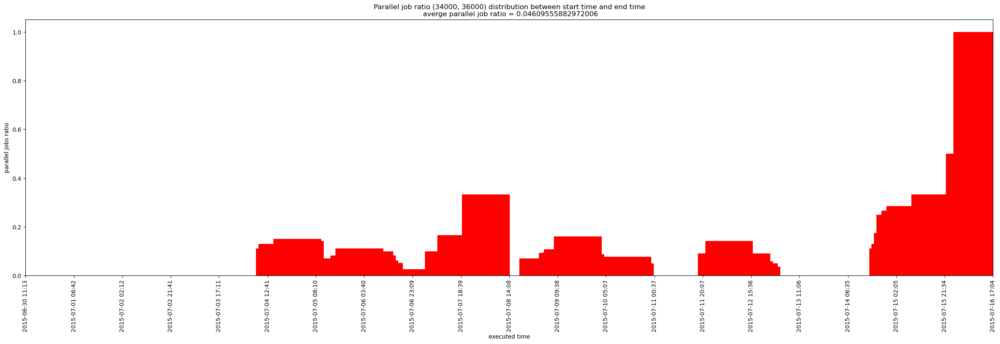

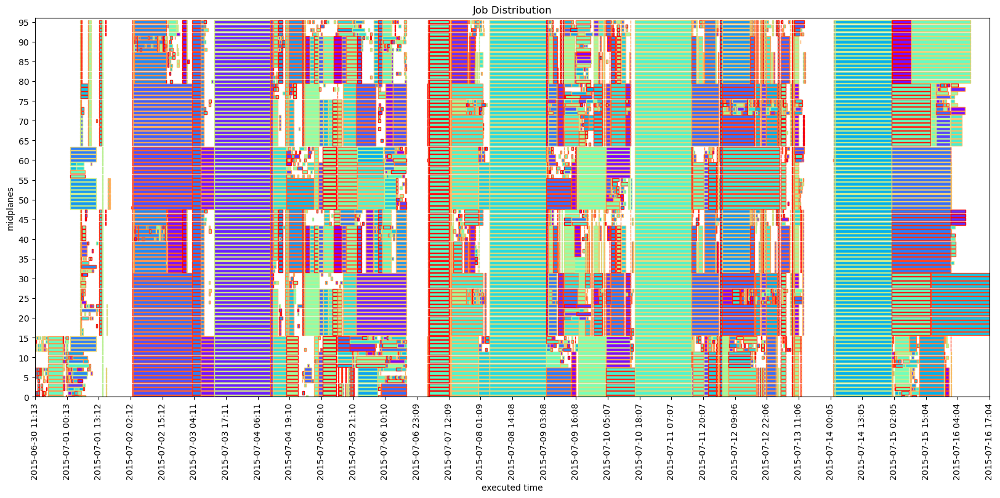

In [ ]:
num_group = 20
data = pd.read_csv("ANL-ALCF-DJC-MIRA_20150101_20151231.csv")
max_end_time = Max_end_time(data)
Sorted_start_time_list = sort_job_id(data,'START_TIMESTAMP')
data = add_group_id(data,num_group )

total_jobs = len(data['LOCATION'])
# total_jobs = 4000
num_jobs_per_fig = 2000
for i in tqdm(range(0,total_jobs,num_jobs_per_fig)):
    start_job_id0 = i
    end_job_id0 = i + num_jobs_per_fig
    if end_job_id0 > total_jobs:
        end_job_id0 = total_jobs
#     print(start_job_id0, end_job_id0)
    local_data = data.iloc[range(start_job_id0,end_job_id0)]
    DataFrame(local_data).to_csv(f"final_traces/trace_{start_job_id0}_{end_job_id0}.csv", index=False, header=False, sep=';')
    draw_job_distribution(data, start_job_id0, end_job_id0, max_end_time, Sorted_start_time_list, num_group)